In [5]:
import pandas as pd

In [7]:
data = pd.read_csv("../illegal_fishing_activities_model/trollers.csv")

In [9]:
data

,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source
0,7.652701e+13,1.337836e+09,0.000000,3162.200195,0.0,0.000000,51.887592,4.356583,-1.0,gfw
1,7.652701e+13,1.338199e+09,0.000000,4999.877441,0.0,0.000000,51.242130,4.403008,-1.0,gfw
2,7.652701e+13,1.343752e+09,0.000000,66308.250000,8.6,292.200012,51.960873,5.196125,-1.0,gfw
3,7.652701e+13,1.350795e+09,0.000000,15296.682617,0.0,0.000000,51.231094,4.526647,-1.0,gfw
4,7.652701e+13,1.351808e+09,0.000000,15296.682617,0.0,0.000000,51.231098,4.526487,-1.0,gfw
...,...,...,...,...,...,...,...,...,...,...
166238,2.740638e+14,1.479318e+09,999.975464,35382.746094,0.0,265.500000,41.468735,36.132484,-1.0,gfw
166239,2.740638e+14,1.479319e+09,999.975464,35382.746094,0.0,300.100006,41.468742,36.132500,-1.0,gfw
166240,2.740638e+14,1.479355e+09,9848.616211,12369.013672,2.4,123.800003,41.379627,36.371731,-1.0,gfw
166241,2.740638e+14,1.479356e+09,9433.749023,11704.412109,2.9,120.000000,41.370407,36.387154,-1.0,gfw


In [11]:
# Check for missing values in the dataset
missing_values = data.isnull().sum()

# Analyze unique values in the 'is_fishing' column
is_fishing_unique = data['is_fishing'].unique()

missing_values, is_fishing_unique


(mmsi                   0
 timestamp              0
 distance_from_shore    0
 distance_from_port     0
 speed                  0
 course                 0
 lat                    0
 lon                    0
 is_fishing             0
 source                 0
 dtype: int64,
 array([-1.        ,  1.        ,  0.        ,  0.6666667 ,  0.33333334]))

In [13]:
from sklearn.preprocessing import MinMaxScaler

# Map 'is_fishing' column to binary values (1 for fishing, 0 for not fishing, excluding -1)
data_cleaned = data[data['is_fishing'] != -1].copy()
data_cleaned['is_fishing'] = (data_cleaned['is_fishing'] > 0).astype(int)

# Normalize numeric columns
scaler = MinMaxScaler()
numeric_cols = ['distance_from_shore', 'distance_from_port', 'speed', 'course', 'lat', 'lon']
data_cleaned[numeric_cols] = scaler.fit_transform(data_cleaned[numeric_cols])

# Convert timestamp to datetime and extract useful features
data_cleaned['timestamp'] = pd.to_datetime(data_cleaned['timestamp'], unit='s')
data_cleaned['hour'] = data_cleaned['timestamp'].dt.hour
data_cleaned['day_of_week'] = data_cleaned['timestamp'].dt.dayofweek

# Display the cleaned dataset's first few rows
data_cleaned.head()


,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source,hour,day_of_week
2900,7.652701e+13,2015-05-07 13:18:41,0.010609,0.099126,0.227273,0.859128,0.002595,0.870161,1,gfw,13,3
2901,7.652701e+13,2015-05-07 13:34:03,0.010609,0.110826,0.636364,0.672965,0.002691,0.870179,1,gfw,13,3
2902,7.652701e+13,2015-05-07 13:58:40,0.000000,0.106504,0.560606,0.864685,0.002671,0.870199,1,gfw,13,3
2903,7.652701e+13,2015-05-07 14:12:11,0.000000,0.080188,0.462121,0.202556,0.002140,0.870068,1,gfw,14,3
2904,7.652701e+13,2015-05-07 14:24:16,0.000000,0.106504,0.515152,0.945818,0.002457,0.870195,1,gfw,14,3


In [14]:
import numpy as np
from sklearn.model_selection import train_test_split

# Group by 'mmsi' to create sequences and sort by timestamp
data_cleaned.sort_values(by=['mmsi', 'timestamp'], inplace=True)
grouped = data_cleaned.groupby('mmsi')

# Create sequences for RNN (window size = 10 observations per sequence)
window_size = 10
sequences = []
labels = []

for _, group in grouped:
    if len(group) >= window_size:
        for i in range(len(group) - window_size + 1):
            sequence = group.iloc[i:i + window_size][['distance_from_shore', 'distance_from_port', 'speed', 
                                                      'course', 'lat', 'lon', 'hour', 'day_of_week']].values
            label = group.iloc[i + window_size - 1]['is_fishing']  # Label is the last observation in the window
            sequences.append(sequence)
            labels.append(label)

# Convert to numpy arrays
X = np.array(sequences)
y = np.array(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inspect shapes of the training and testing sets
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((6240, 10, 8), (1560, 10, 8), (6240,), (1560,))

In [16]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Define the RNN model
model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.3),
    LSTM(32, return_sequences=False),
    Dropout(0.3),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')  # Binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model's summary
model.summary()


C:\Users\venka\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 10, 64)              │          18,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 10, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,649 (123.63 KB)

 Trainable params: 31,649 (123.63 KB)

 Non-trainable params: 0 (0.00 B)

In [17]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import numpy as np

# Model definition
model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.3),
    LSTM(32, return_sequences=False),
    Dropout(0.3),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')  # Binary classification
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Training the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=10,
    batch_size=32,
    verbose=1
)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.2f}")


Epoch 1/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6689 - loss: 0.5874 - val_accuracy: 0.8622 - val_loss: 0.3506
Epoch 2/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.8691 - loss: 0.3284 - val_accuracy: 0.8806 - val_loss: 0.2897
Epoch 3/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.8865 - loss: 0.2943 - val_accuracy: 0.9054 - val_loss: 0.2553
Epoch 4/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.8985 - loss: 0.2656 - val_accuracy: 0.9143 - val_loss: 0.2313
Epoch 5/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.9155 - loss: 0.2346 - val_accuracy: 0.8958 - val_loss: 0.2388
Epoch 6/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.9206 - loss: 0.2169 - val_accuracy: 0.9191 - val_loss: 0.2147
Epoch 7/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9246 - loss: 0.2057 - val_accuracy: 0.9247 - val_loss: 0.2111
Epoch 8/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.9291 - loss: 0.1971 - val_accur

In [18]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [27]:
import folium

# Create a base map centered around the data
map_center = [data_cleaned['lat'].mean(), data_cleaned['lon'].mean()]
base_map = folium.Map(location=map_center, zoom_start=6)

# Add vessel routes
for _, row in data_cleaned.iterrows():
    color = 'red' if row['is_fishing'] == 1 else 'blue'  # Red for fishing, blue for not fishing
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        color=color,
        fill=True,
        fill_opacity=0.7
    ).add_to(base_map)

# Save map
base_map.save("illegal_fishing_map.html")


C:\Users\venka\AppData\Local\Temp\ipykernel_2944\2182397024.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_fishing.index, y=hourly_fishing.values, palette='coolwarm')


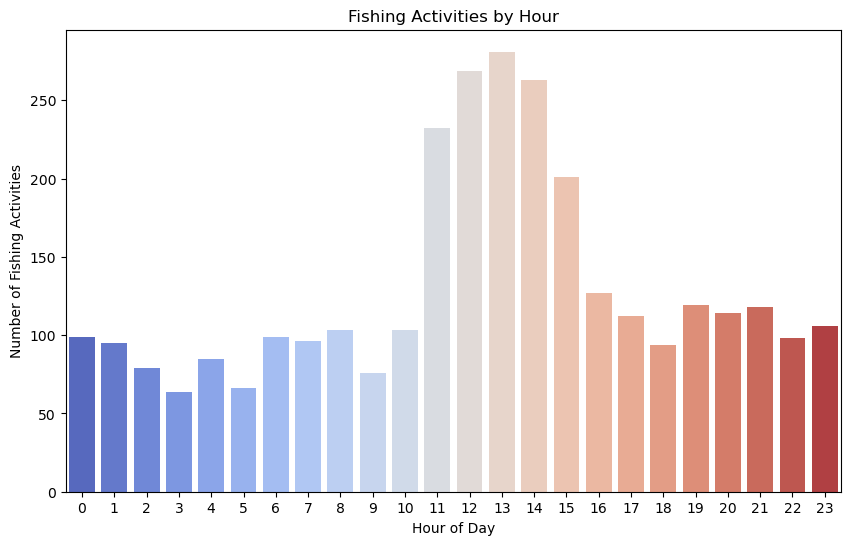

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count fishing activity by hour
hourly_fishing = data_cleaned[data_cleaned['is_fishing'] == 1]['hour'].value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=hourly_fishing.index, y=hourly_fishing.values, palette='coolwarm')
plt.title("Fishing Activities by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Fishing Activities")
plt.show()


In [15]:
import matplotlib.pyplot as plt

# Extract distances for illegal fishing activities
illegal_fishing_distances = data['distance_from_shore']

# Calculate summary statistics
distance_stats = {
    "Minimum Distance": illegal_fishing_distances.min(),
    "Maximum Distance": illegal_fishing_distances.max(),
    "Mean Distance": illegal_fishing_distances.mean(),
    "Median Distance": illegal_fishing_distances.median(),
}

# Display summary statistics
distance_stats


{'Minimum Distance': 0.0,
 'Maximum Distance': 97742.171875,
 'Mean Distance': 5116.678753081254,
 'Median Distance': 999.9754638672}

In [36]:
import folium
from IPython.display import display, HTML

# Create a map centered around the illegal fishing activities
illegal_fishing_map = folium.Map(location=map_center, zoom_start=6)

# Add markers and distance lines to the map
for _, row in illegal_fishing_data.iterrows():
    fishing_location = [row['lat'], row['lon']]
    
    # Add marker for illegal fishing location
    folium.CircleMarker(
        location=fishing_location,
        radius=5,
        color='red',
        fill=True,
        fill_opacity=0.8,
        popup=f"Illegal Fishing\nDistance from Shore: {row['distance_from_shore']:.2f} km",
    ).add_to(illegal_fishing_map)
    
    # Draw a line from the illegal fishing location to the shore
    folium.PolyLine(
        locations=[fishing_location, shore_location],
        color='blue',
        weight=1.5,
        opacity=0.8,
        tooltip=f"Distance: {row['distance_from_shore']:.2f} km"
    ).add_to(illegal_fishing_map)

    
    folium.Circle(
    location=fishing_location,
    radius=5000,  # Radius in meters
    color='purple',
    fill=True,
    fill_color='purple',
    fill_opacity=0.2
).add_to(illegal_fishing_map)
    

# Display the map inline in Jupyter Notebook
display(HTML(illegal_fishing_map._repr_html_()))


In [31]:
import folium
from folium import plugins

# Filter the dataset for illegal fishing activities (is_fishing == 1)
illegal_fishing_data = data_cleaned[data_cleaned['is_fishing'] == 1]

# Approximate a shore location for visualization (assuming lat/lon = 0, 0 as an example)
shore_location = [0, 0]

# Create a base map centered around the average location of illegal fishing activities
map_center = [illegal_fishing_data['lat'].mean(), illegal_fishing_data['lon'].mean()]
illegal_fishing_map = folium.Map(location=map_center, zoom_start=6)

# Add illegal fishing locations and lines to the shore to the map
for _, row in illegal_fishing_data.iterrows():
    fishing_location = [row['lat'], row['lon']]
    
    # Add marker for illegal fishing location
    folium.CircleMarker(
        location=fishing_location,
        radius=4,
        color='red',
        fill=True,
        fill_opacity=0.7,
        popup=f"Distance from shore: {row['distance_from_shore']:.2f}"
    ).add_to(illegal_fishing_map)
    
    # Draw a line from the illegal fishing location to the shore
    folium.PolyLine(
        locations=[fishing_location, shore_location],
        color='blue',
        weight=1.5,
        opacity=0.8
    ).add_to(illegal_fishing_map)

# Save map to an HTML file
map_file_path = "../illegal_fishing_map.html"
illegal_fishing_map.save(map_file_path)

map_file_path


'../illegal_fishing_map.html'